In [44]:
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import matplotlib as mpl

def plot_adata(adata_to_plot, cluster_key, plot_type="umap", keyword=None):
    """
    Plot AnnData embeddings (UMAP or spatial).
    
    Parameters:
    - adata_to_plot: AnnData object with .obsm and .obs fields.
    - cluster_key: key in adata.obs to color by.
    - plot_type: "umap" or "spatial".
    - keyword: if provided, only highlight clusters containing this substring; others grouped as "Other".
    """

    # Prepare DataFrame for plotting
    if plot_type == "spatial":
        coords = adata_to_plot.obsm['spatial'].copy()
        df = pd.DataFrame(coords, columns=['x', 'y'], index=adata_to_plot.obs_names)
    else:  # UMAP
        df = pd.DataFrame(
            adata_to_plot.obsm['X_umap'],
            columns=['UMAP1', 'UMAP2'],
            index=adata_to_plot.obs_names
        )

    # Original cluster labels as strings
    df[cluster_key] = adata_to_plot.obs[cluster_key].astype(str)

    # If a keyword is provided, label matching clusters, others as "Other"
    if keyword:
        df['plot_label'] = df[cluster_key].apply(lambda x: x if keyword in x else 'Other')
        color_key = 'plot_label'
        legend_title = f"Highlighted: {keyword}"
    else:
        color_key = cluster_key
        legend_title = cluster_key

    # Get a discrete color map
    tab20 = [mpl.colors.rgb2hex(c) for c in plt.get_cmap('tab20').colors]

    # Choose appropriate scatter fields
    if plot_type == "spatial":
        fig = px.scatter(
            df,
            x='x',
            y='y',
            color=color_key,
            title='Spatial scatter — manual cell types',
            hover_name=df.index,
            width=1600,
            height=700
        )
        fig.update_traces(marker=dict(size=2, opacity=0.8))
        fig.update_yaxes(autorange='reversed')
    else:  # UMAP
        fig = px.scatter(
            df,
            x='UMAP1',
            y='UMAP2',
            color=color_key,
            title='UMAP embedding — Leiden clusters',
            color_discrete_sequence=tab20,
            hover_name=df.index,
            width=1400,
            height=1200
        )
        fig.update_traces(marker=dict(size=3, opacity=0.8))

    # Adjust legend and layout
    fig.update_layout(
        legend_title_text=legend_title,
        legend=dict(
            itemsizing='constant',
            traceorder='normal',
            bgcolor='rgba(255,255,255,0.5)',
            x=1.02,
            y=1
        ),
        margin=dict(l=20, r=200, t=50, b=20)
    )

    fig.show()

In [45]:
import pandas as pd
import scanpy as sc

Tissue, TableFolder = "Region3","REGION3_TABLES"

in_out_path = f"/Volumes/ProstateCancerEvoMain/dbs/Ongoing/{Tissue}/{TableFolder}"
adata_xenium_p = sc.read_h5ad(f"{in_out_path}/{Tissue}_Xenium_Phen_HE_Integrated.Xenium_Process_Table.Cell_Type_Annotated_Auto.V3.All_Genes.h5ad")
adata_xenium_p



AnnData object with n_obs × n_vars = 169163 × 5101
    obs: 'cell_id', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'region', 'z_level', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'cell_type', 'leiden', 'cell_type_xenium_panel', 'cell_type_xenium_panel_not_confident'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'cell_type_colors', 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_leiden', 'spatialdata_

In [53]:
ann = pd.read_csv(f"/Volumes/ProstateCancerEvoMain/Remote/dbs/REGION_TABLES/{TableFolder}/{Tissue}.ScTypeAnn_Multimodal_WNN.csv")
ann

,cell_id,sctype_classification,seurat_clusters
0,aaaabeki-1,tumor_cell_marker,0
1,aaaalflk-1,tumor_cell_marker,0
2,aaaaobad-1,tumor_cell_marker,0
3,aaabgfpe-1,tumor_cell_marker,0
4,aaabmbbm-1,tumor_cell_marker,0
...,...,...,...
169158,oimcofah-1,basal_cell_of_prostate_epithelium,8
169159,oimdnick-1,basal_cell_of_prostate_epithelium,8
169160,oimedlfa-1,basal_cell_of_prostate_epithelium,8
169161,oimeicfc-1,mature_B_cell,6


In [54]:
adata_xenium_p.obs["sctype_classification"] = ann["sctype_classification"].values
adata_xenium_p.obs["seurat_clusters"] = ann["seurat_clusters"].values
adata_xenium_p.obs["sctype_seurat_clusters"] = ann["sctype_classification"].values.astype(str) +"_"+ann["seurat_clusters"].values.astype(str)

In [55]:
plot_adata(adata_xenium_p, "sctype_classification", plot_type="umap")


In [34]:
plot_adata(adata_xenium_p, "sctype_seurat_clusters", plot_type="umap",keyword="follicular_B_cell")


In [ ]:
# 2. Compute DE genes per cluster

ranked = sc.tl.rank_genes_groups(
    adata_xenium_p,
    groupby='sctype_classification',
    method='wilcoxon',     # or 't-test', 't-test_overestim_var'
    pts=True,              # calculate fraction expressed
)


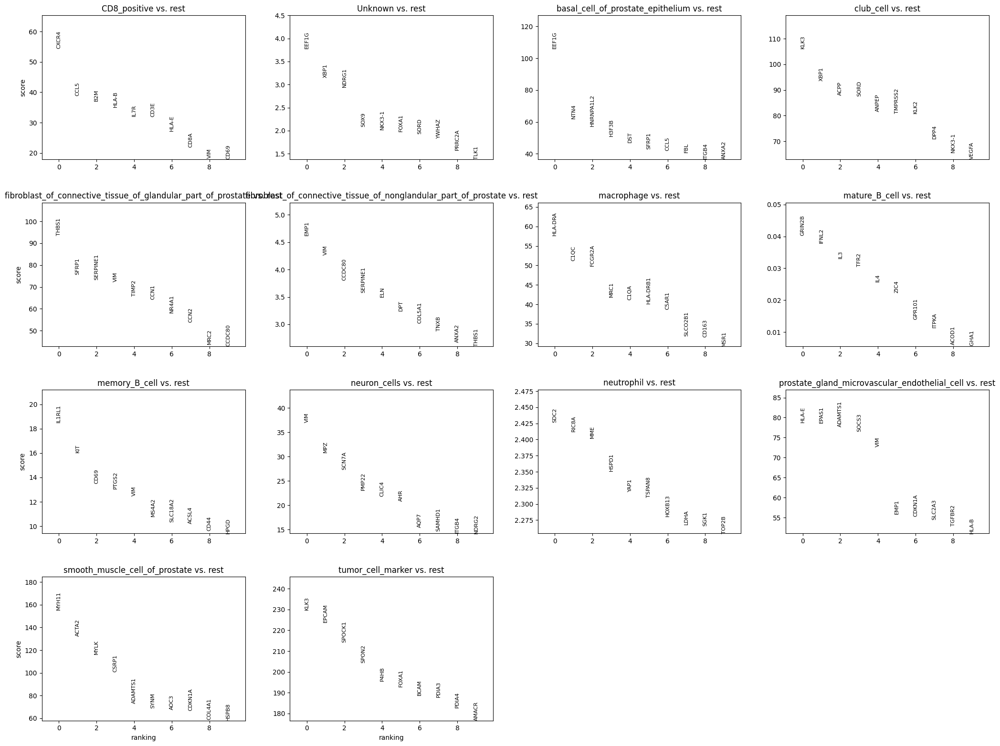

In [39]:
sc.pl.rank_genes_groups(adata_xenium_p, n_genes=10, sharey=False)
